In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
from moviepy.editor import VideoFileClip

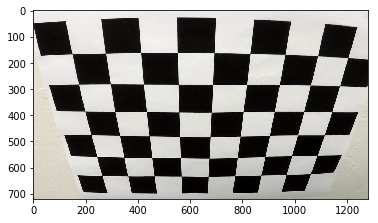

In [3]:
# Used the Calibration image from the repository

img = mpimg.imread('camera_cal/calibration2.jpg')
org_img = img
plt.imshow(img)

In [4]:
# Initialized the objpts and imgpts for the chess board example

objpts = []
imgpts = []
objp = np.zeros((6*9, 3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)

In [5]:
# Conversion of BGR to Gray scale image, and used CV2 function to identify corners

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
print (ret)

True


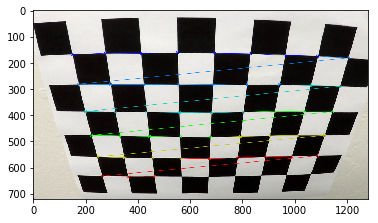

In [6]:
# Used the CV2 drawChessboardCorners to plot the corners

if ret == True:
    imgpts.append(corners)
    objpts.append(objp)
    
    img - cv2.drawChessboardCorners(img, (8,6), corners, ret)
    plt.imshow(img)


In [7]:
# Used the CV2 calibrateCamera to calibrate using the Chessboard image with the corners

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpts, imgpts, gray.shape[::-1], None, None)

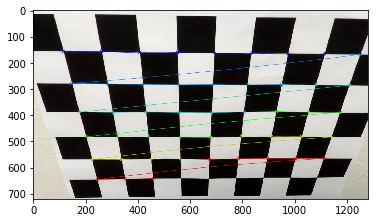

In [8]:
# Function to get the undistort image with the give Chess board corner image

undist = cv2.undistort(img, mtx, dist, None, mtx)
plt.imshow(undist)

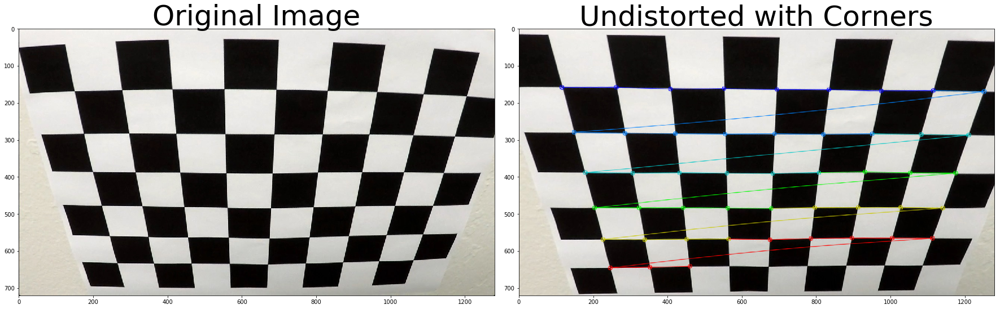

In [9]:
# Just a show, to display both the original and undistorted image with corners plotted

org_img = mpimg.imread('camera_cal/calibration2.jpg')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(org_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist, cmap='gray')
ax2.set_title('Undistorted with Corners', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [10]:
# Function to get the Perspective image with the given distorted image

def corners_unwarp_chess(img, nx, ny, mtx, dist):
    # Pass in your image into this function
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    # 2) Convert to grayscale
    # 3) Find the chessboard corners
    # 4) If corners found: 
            # a) draw corners
            # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
                 #Note: you could pick any four of the detected corners 
                 # as long as those four corners define a rectangle
                 #One especially smart way to do this would be to use four well-chosen
                 # corners that were automatically detected during the undistortion steps
                 #We recommend using the automatic detection of corners in your code
            # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
            # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
            # e) use cv2.warpPerspective() to warp your image to a top-down view
    #delete the next two lines

    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    plt.imshow(undist)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    #plt.imshow(gray)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    print (ret)

    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

        return warped, M

    return 

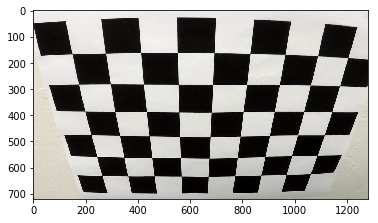

In [11]:
img = mpimg.imread('camera_cal/calibration2.jpg')
plt.imshow(img)

True


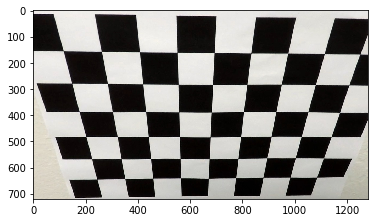

In [12]:
# Used the corners unwarp function to get the perpsective image

nx = 8 # the number of inside corners in x
ny = 6 # the number of inside corners in y
warped2, M = corners_unwarp_chess(img, nx, ny, mtx, dist)

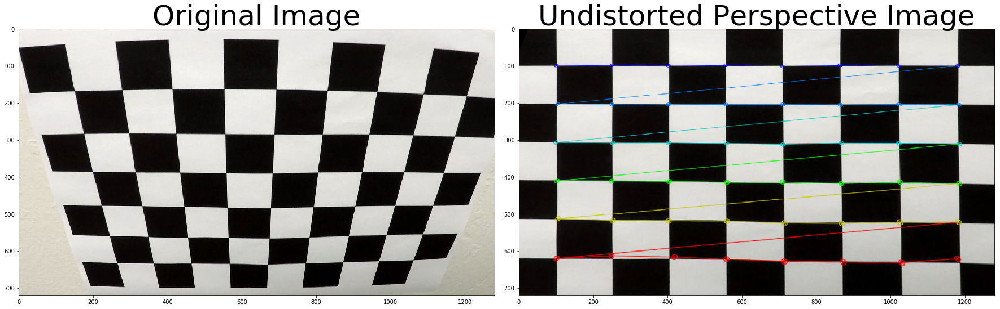

In [13]:
# Just a plot to show both the original and undistorted Perspective image

org_img = mpimg.imread('camera_cal/calibration2.jpg')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(org_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped2, cmap='gray')
ax2.set_title('Undistorted Perspective Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [74]:
# This function original image  to undistorted and perspective image

def corners_unwarp(img, mtx, dist):
    
    img_shape = img.shape
    
    print("Image shape:", img_shape)
    
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    plt.imshow(undist)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    plt.imshow(gray)
    
    
    # Choose offset from image corners to plot detected corners
    # This should be chosen to present the result at the proper aspect ratio
    # My choice of 100 pixels is not exact, but close enough for our purpose here
    offset = 100 # offset for dst points
    # Grab the image shape
    img_size = (gray.shape[1], gray.shape[0])

    #corners = [[580, 460],[710,460],[1150,720],[150,720]]
    #corners = [[580, 460],[750,460],[1150,720],[150,720]]
    #corners = [[220,720], [1110, 720], [722, 470], [570, 470]]

    #corners_dst = [[320,720], [920, 720], [920, 1], [320, 1]]

    #src = np.array([[580, 460],[750,460],[1150,720],[150,720]]).astype(np.float32)
    #dst = np.array([[320,720], [920, 720], [920, 1], [320, 1]]).astype(np.float32)
    
    #Worksrc = np.array([[585, 460], [203, 720], [1127, 720], [695, 460]]).astype(np.float32)
    #Workdst = np.array([[320, 0], [320, 720], [960, 720], [960, 0]]).astype(np.float32)

    #work 2 src = np.array([[585, 460], [270, 720], [1127, 720], [695, 460]]).astype(np.float32)
    
    src = np.array([[585, 460], [280, 720], [1127, 720], [695, 460]]).astype(np.float32)
    dst = np.array([[320, 0], [320, 720], [960, 720], [960, 0]]).astype(np.float32)
    
    # For source points I'm grabbing the outer four detected corners
    #src = np.float32(corners)
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    #dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     #[img_size[0]-offset, img_size[1]-0], 
                                     #[offset, img_size[1]-0]])
    
    #src = np.float32(corners)
    #dst = np.float32(corners_dst)
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    MInv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)

    return warped, M, MInv, undist


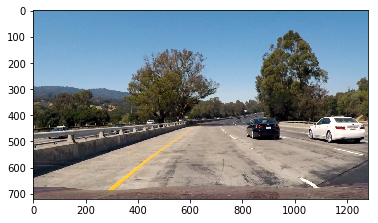

In [277]:
img = mpimg.imread('test_images/test1.jpg')
plt.imshow(img)

Image shape: (720, 1280, 3)


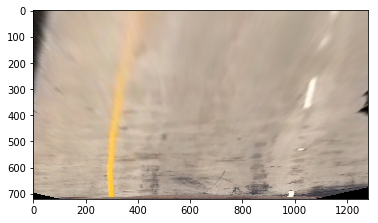

In [76]:
# Called the corners_unwarp to get the Perspective image

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpts, imgpts, gray.shape[::-1], None, None)

warped2, M, Minv, undist = corners_unwarp(img, mtx, dist)
plt.imshow(warped2)

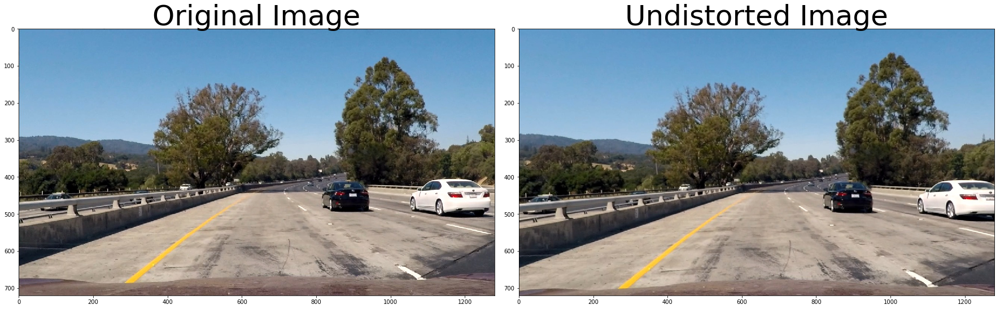

In [77]:
# Just a plot to show the Original Image and Undistorted Image

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist, cmap='gray')
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [78]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary_output

In [79]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    
     # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1


    return binary_output

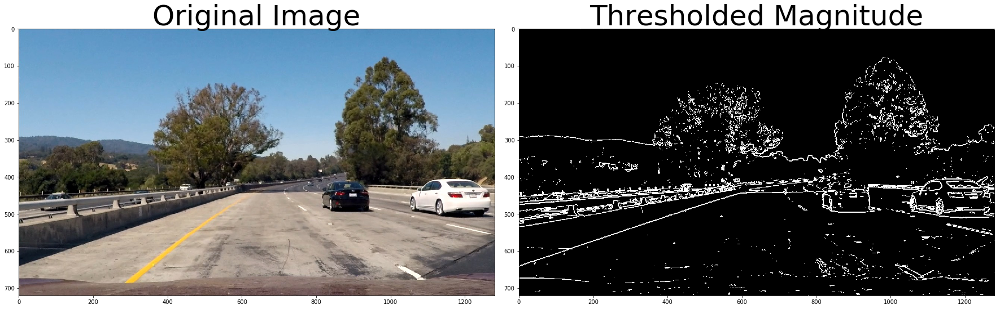

In [80]:
# Run the function
mag_binary = mag_thresh(img, sobel_kernel=3, mag_thresh=(40, 200))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [81]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    return binary_output

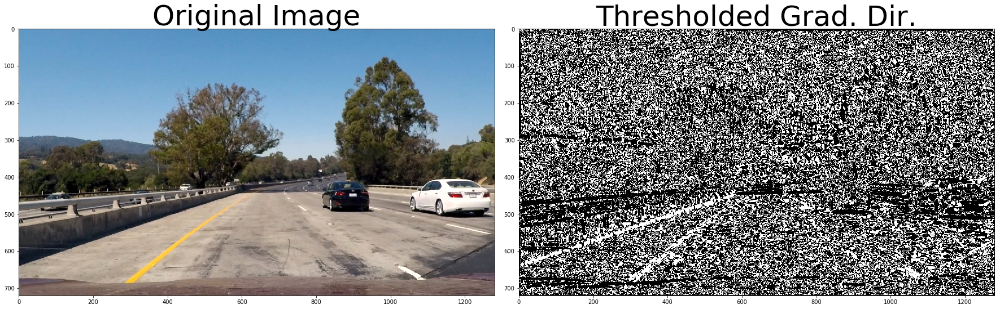

In [82]:
# Run the function to get direction threshold

dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [83]:
# Choose a Sobel kernel size

ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(10, 200))
grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(10, 200))
mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(40, 200))
dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0, np.pi/2))

In [84]:
# Gets the combined image

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

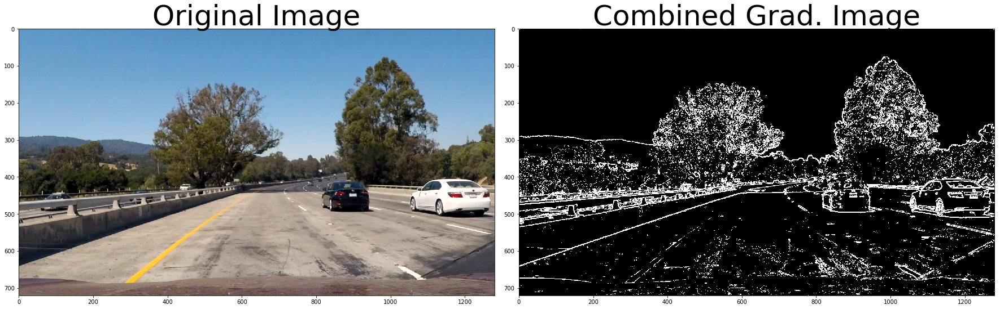

In [85]:
# Plot to show both the original image, and Combined gradiant image

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined Grad. Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

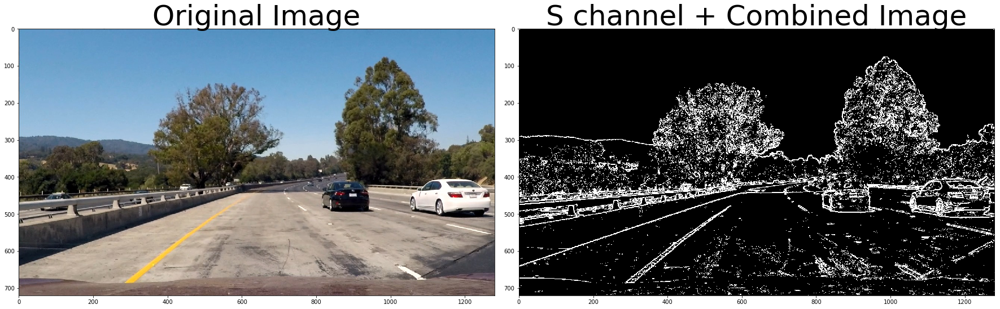

In [86]:
# To show the HLS usage with S channel, and plotted both original and combined image with S channel

hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
s = hls[:,:,2]
s_binary = np.zeros_like(combined)
s_binary[(s > 170) & (s < 255)] = 1
color_binary = np.zeros_like(combined)
color_binary[(s_binary > 0) | (combined > 0)] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(color_binary, cmap='gray')
ax2.set_title('S channel + Combined Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

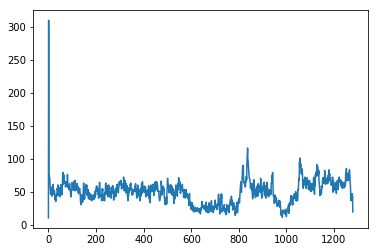

In [87]:
# Tested the historgram

import numpy as np
histogram = np.sum(color_binary[color_binary.shape[0]//2:,:], axis=0)
plt.plot(histogram)

Image shape: (720, 1280, 3)


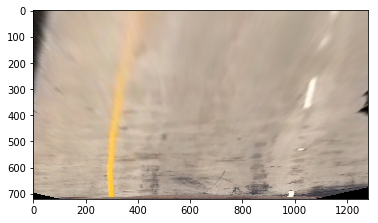

In [88]:
warped2, M, Minv, undist = corners_unwarp(img, mtx, dist)
plt.imshow(warped2)

In [89]:
import numpy as np
histogram = np.sum(warped2[warped2.shape[0]//2:,:], axis=0)
# plt.plot(histogram)

In [294]:
# Main pipline code that does the Undistort, threshold, HLS/S-channel

def pipeline3(img):

    ksize = 3 # Choose a larger odd number to smooth gradient measurements
    #img = cv2.resize(img, (720, 405))
    #img = cv2.GaussianBlur(img, (ksize, ksize), 0)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpts, imgpts, gray.shape[::-1], None, None)

    warped, M, Minv, undist = corners_unwarp(img, mtx, dist)
   
    hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS)
    
    s = hls[:,:,2]
    h = hls[:,:,0]
    l = hls[:,:,1]
    
        
    #plt.imshow(img)
    ksize = 7
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=ksize, thresh=(40, 255))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=ksize, thresh=(40, 255))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(40, 200))
    #plt.imshow(mag_binary)
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0, np.pi/2))
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    

    s_binary = np.zeros_like(combined)
    h_binary = np.zeros_like(combined)
    #l_binary = np.zeros_like(combined)
    
    s_binary[(s > 200) & (s < 255)] = 1
    #h_binary[(h > 20) & (h < 50)] = 1
    #l_binary[(l > 150) & (l < 255)] = 1
    
    color_binary = np.zeros_like(combined)
    color_binary[(s_binary > 0) | (combined > 0)] = 1
    
    #final_binary = np.zeros_like(color_binary)
    #final_binary[((h_binary > 0) & (l_binary > 0)) | (combined > 0)] = 1
    #final_binary[((h_binary > 0) & (s_binary > 0)) | (combined > 0)] = 1
   
    return warped, M, Minv, color_binary, undist

In [295]:
# Main pipline code that does the Undistort, threshold, HLS/S-channel

def pipeline4(img):

    ksize = 3 # Choose a larger odd number to smooth gradient measurements
    #img = cv2.resize(img, (720, 405))
    #img = cv2.GaussianBlur(img, (ksize, ksize), 0)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpts, imgpts, gray.shape[::-1], None, None)

    warped, M, Minv, undist = corners_unwarp(img, mtx, dist)
   
    
    hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS)
    
    s = hls[:,:,2]
    h = hls[:,:,0]
    l = hls[:,:,1]
    
        
    #plt.imshow(img)
    ksize = 7
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=ksize, thresh=(10, 250))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=ksize, thresh=(10, 250))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(10, 200))
    #plt.imshow(mag_binary)
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0, np.pi/2))
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    

    s_binary = np.zeros_like(combined)
    h_binary = np.zeros_like(combined)
    l_binary = np.zeros_like(combined)
    
    s_binary[(s > 170) & (s < 255)] = 1
    h_binary[(h > 20) & (h < 50)] = 1
    l_binary[(l > 150) & (l < 255)] = 1
    
    #color_binary = np.zeros_like(combined)
    #color_binary[(s_binary > 0) | (combined > 0)] = 1
    
    
    image_HSV = cv2.cvtColor(warped,cv2.COLOR_RGB2HSV)
    yellow_hsv_low  = np.array([ 0,  100,  100])
    yellow_hsv_high = np.array([ 80, 255, 255])
    white_hsv_low  = np.array([ 0,   0,   160])
    white_hsv_high = np.array([ 255,  80, 255])
    mask_yellow =cv2.inRange(image_HSV, yellow_hsv_low, yellow_hsv_high)
    mask_white = cv2.inRange(image_HSV,white_hsv_low,white_hsv_high)
    mask_lane = cv2.bitwise_or(mask_yellow,mask_white)

    color_binary[(mask_lane > 0) | (combined > 0)] = 1

    return warped, M, Minv, color_binary, undist

In [296]:
# Used to detect the lane curve in detect lanes

def lanecurvature(leftx, lefty, rightx, righty) :
    
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    
    return left_curverad, right_curverad

In [297]:
# Lane fit function that does the histogram, sliding window, curvature fitting

def lanefit(binary_warped, img):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    

    # Fit new polynomials to x,y in world space
    #left_curverad, right_curverad = lanecurvature(leftx, lefty, rightx, righty)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    

    return ploty, left_fitx, right_fitx, out_img


In [298]:
def find_3p_circle_radius(x1,y1,x2,y2,x3,y3):
    
    # source : http://www.intmath.com/applications-differentiation/8-radius-curvature.php
    m1 = (y2-y1)/(x2-x1)
    m2 = (y3-y2)/(x3-x2)
    
    xc = (m1*m2*(y1-y3)+m2*(x1+x2)-m1*(x2+x3))/(2*(m2-m1))
    yc = -(xc-(x1+x2)/2)/m1+(y1+y2)/2
    
    Radius = np.sqrt((x2-xc)*(x2-xc)+(y2-yc)*(y2-yc))
    
    return m1, m2, xc, yc, Radius

In [399]:
# Lane fit function that does the histogram, sliding window, curvature fitting

def lanefit2(binary_warped, img, Minv):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    

    # Fit new polynomials to x,y in world space

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    """
    New code
    """
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Used 3 y values for max, mean and min
    y_eval_max = np.max(ploty)
    y_eval_mean = np.mean(ploty)
    y_eval_min = np.min(ploty)
    
    left_fitx_1 = left_fit[0]*y_eval_max**2 + left_fit[1]*ploty + left_fit[2]
    left_fitx_2 = left_fit[0]*y_eval_mean**2 + left_fit[1]*ploty + left_fit[2]
    left_fitx_3 = left_fit[0]*y_eval_min**2 + left_fit[1]*ploty + left_fit[2]
    
    right_fitx_1 = right_fit[0]*y_eval_max**2 + right_fit[1]*ploty + right_fit[2]
    right_fitx_2 = right_fit[0]*y_eval_mean**2 + right_fit[1]*ploty + right_fit[2]
    right_fitx_3 = right_fit[0]*y_eval_min**2 + right_fit[1]*ploty + right_fit[2]
    
    
    lm1, lm2, lxc, lyc, lradius = find_3p_circle_radius(left_fitx_1,y_eval_max,left_fitx_2,y_eval_mean,left_fitx_3,y_eval_min,)
    l_steering_angle = 5*360/lxc # assume xc <> 0, xc and radius value is very close, xc will show the direction as well
    
    
    rm1, rm2, rxc, ryc, rradius = find_3p_circle_radius(right_fitx_1,y_eval_max,right_fitx_2,y_eval_mean,right_fitx_3,y_eval_min,)
    
    r_steering_angle = 5*360/rxc # assume xc <> 0, xc and radius value is very close, xc will show the direction as well
    steering_angle = l_steering_angle + r_steering_angle
    turning_radius = (lradius+rradius)/2 # smooth out the radius
    
    # Find camera position
    left_mean = np.mean(leftx)
    right_mean = np.mean(rightx)
    camera_pos = (combined.shape[1]/2)-np.mean([left_mean, right_mean])
    
    # Fit new polynomials to x,y in world space
    #left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    #right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    
    left_fit_cr = np.polyfit(np.array(lefty,dtype=np.float32)*ym_per_pix, \
                         np.array(leftx,dtype=np.float32)*xm_per_pix, 2)
    right_fit_cr = np.polyfit(np.array(righty,dtype=np.float32)*ym_per_pix, \
                          np.array(rightx,dtype=np.float32)*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval_max*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval_max*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    
    
    """
    New Code end
    """
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    #plt.imshow(warped)
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
        # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(img,'Camera Position' + ' [' + str(camera_pos*xm_per_pix)[:6] + '] m',(10,30), font, 1,(255,255,255),2)
    cv2.putText(img,'Turning Radius ' +str(turning_radius)[:6] + '] m' ,(10,60), font, 1,(255,255,255),2)
    
    cv2.putText(img,'Steering Angle -VE Left, +VE Right'+'{:.6}'.format(str(abs(steering_angle))) + '] deg',(10,90), font, 1,(255,255,255),2)
 
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    
    result = cv2.addWeighted(img, 1.0, newwarp, 0.3, 0)
    
    return result


In [400]:
# final Image does takes the threshold perspective image, lane fitting and 
# generates the final image with inverse perspective transform after fitting the green polygon

def finalImage(warped, img, ploty, left_fitx, right_fitx, Minv):

    warp_zero = np.zeros_like(warped).astype(np.uint8)
    #plt.imshow(warped)
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
        # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1.0, newwarp, 0.3, 0)
    return result

Image shape: (720, 1280, 3)


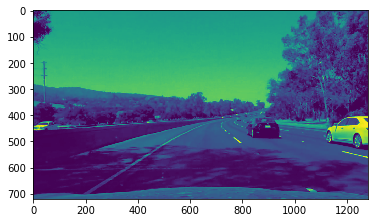

In [401]:
img = mpimg.imread('test/23.jpg')
#plt.imshow(img)
warped, M, Minv, binary_warped, undist = pipeline3(img)
#plt.imshow(color_binary)

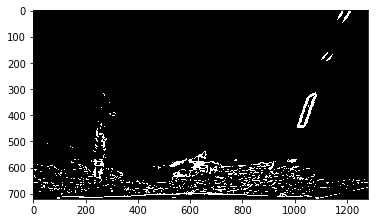

In [402]:
plt.imshow(binary_warped, cmap='gray')

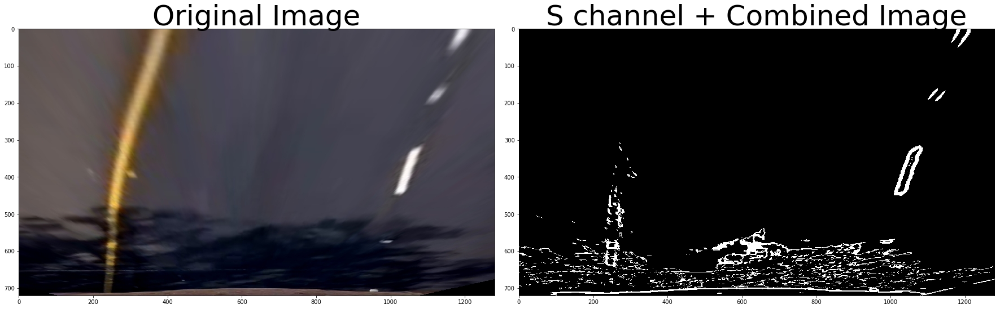

In [403]:
# Original image and S channel combined with Perspective view

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(warped)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binary_warped, cmap='gray')
ax2.set_title('S channel + Combined Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

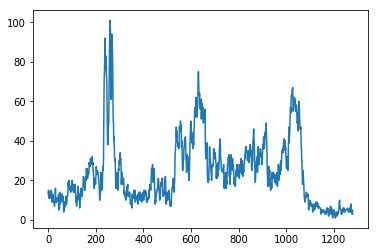

In [404]:
# Histogram showing the peak points in the lane

hist = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
plt.plot(hist)

Image shape: (720, 1280, 3)


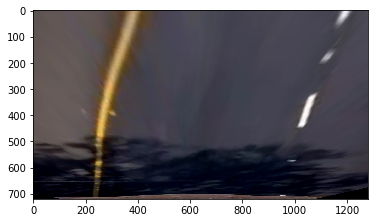

In [405]:
# Test perspective image

warped2, M, Minv, undist = corners_unwarp(img, mtx, dist)
plt.imshow(warped2)

In [406]:
# Test lanefit

ploty, left_fitx, right_fitx, out_img = lanefit(binary_warped, img)

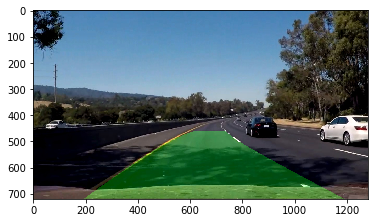

In [407]:
# Test final Image

result = finalImage(binary_warped, img, ploty, left_fitx, right_fitx, Minv)
plt.imshow(result)

In [408]:
# This is main function, that gets the original image and process
# Pipeline, lanefit and final processing 

def process_image(img):
    warped, M, Minv, binary_warped, undist = pipeline3(img)
    ploty, left_fitx, right_fitx, out_img = lanefit(binary_warped, img)
    result = finalImage(binary_warped, img, ploty, left_fitx, right_fitx, Minv)
    return result
    

Image shape: (720, 1280, 3)


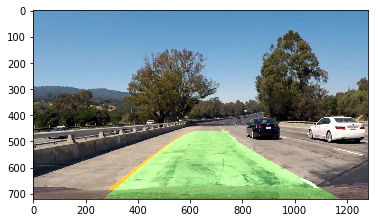

In [409]:
img2 = mpimg.imread('test_images/test1.jpg')
result2 = process_image(img2)
plt.imshow(result2)

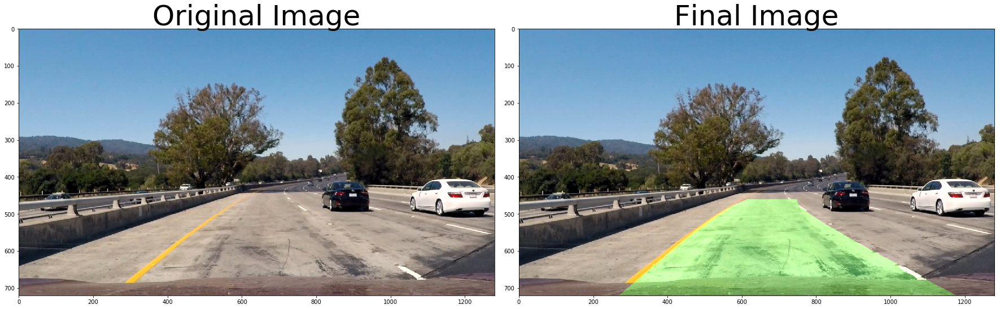

In [410]:
# Showing the original image and Final Image image for a test image

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img2)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(result2, cmap='gray')
ax2.set_title('Final Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

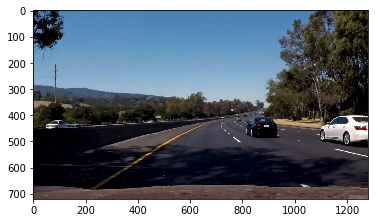

In [411]:
img2 = mpimg.imread('test/23.jpg')
plt.imshow(img2)

In [412]:
def process_image2(img) :
    
    warped, M, Minv, binary_warped, undist = pipeline3(img)
    result = lanefit2(binary_warped, img, Minv)
   
    return result

Image shape: (720, 1280, 3)
215.9293108 m 358.129306769 m


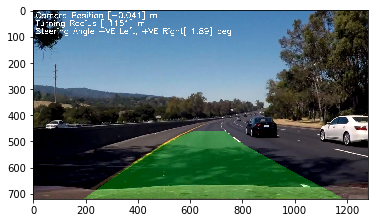

In [ ]:
result = process_image2(img2)
plt.imshow(result)

In [ ]:
# Function to read the video file from repository
# Generate the pipeline video file

clip = VideoFileClip("project_video.mp4")
video_out = "project_video_out5.mp4"

video_cap = clip.fl_image(process_image2)
%time video_cap.write_videofile(video_out, audio=False)

Image shape: (720, 1280, 3)
559.349731412 m 2918.86300286 m
[MoviePy] >>>> Building video project_video_out5.mp4
[MoviePy] Writing video project_video_out5.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

Image shape: (720, 1280, 3)


  0%|          | 1/1261 [00:00<07:37,  2.76it/s]

559.349731412 m 2918.86300286 m
Image shape: (720, 1280, 3)


  0%|          | 2/1261 [00:00<07:28,  2.80it/s]

557.536980085 m 2845.7430005 m
Image shape: (720, 1280, 3)


  0%|          | 3/1261 [00:01<07:16,  2.88it/s]

546.833562691 m 453.844164214 m
Image shape: (720, 1280, 3)


  0%|          | 4/1261 [00:01<07:08,  2.93it/s]

514.789413272 m 712.540269219 m
Image shape: (720, 1280, 3)


  0%|          | 5/1261 [00:01<07:05,  2.95it/s]

508.586462306 m 780.316658662 m
Image shape: (720, 1280, 3)


  0%|          | 6/1261 [00:02<07:03,  2.96it/s]

493.129659883 m 786.025743182 m
Image shape: (720, 1280, 3)


  1%|          | 7/1261 [00:02<07:03,  2.96it/s]

500.040479838 m 744.534630287 m
Image shape: (720, 1280, 3)


  1%|          | 8/1261 [00:02<07:02,  2.96it/s]

509.586051957 m 723.683080551 m
Image shape: (720, 1280, 3)


  1%|          | 9/1261 [00:03<07:03,  2.95it/s]

525.749705944 m 761.112962873 m
Image shape: (720, 1280, 3)


  1%|          | 10/1261 [00:03<07:02,  2.96it/s]

548.552590377 m 740.94684361 m
Image shape: (720, 1280, 3)


  1%|          | 11/1261 [00:03<07:01,  2.97it/s]

557.573715722 m 747.03901177 m
Image shape: (720, 1280, 3)


  1%|          | 12/1261 [00:04<07:07,  2.92it/s]

602.783124311 m 1004.64605921 m
Image shape: (720, 1280, 3)


  1%|          | 13/1261 [00:04<07:16,  2.86it/s]

526.949423338 m 722.355873388 m
Image shape: (720, 1280, 3)


  1%|          | 14/1261 [00:04<07:11,  2.89it/s]

557.520135797 m 530.107310094 m
Image shape: (720, 1280, 3)


  1%|          | 15/1261 [00:05<07:13,  2.87it/s]

In [ ]:
def printImage(img):
    global Count
    #plt.imshow(img)
    print (Count)
    filename = "test/" + str(Count) + '.jpg'
    print (filename)
    img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.imwrite(filename, img2)
    result = process_image2(img)
    filename = "test/" + str(Count) + 'processed.jpg'
    cv2.imwrite(filename, result)
    Count = Count + 1
    return result

In [ ]:
subclip = VideoFileClip("project_video.mp4").subclip(41, 42)
video_out2 = "project_video_out_sub14142.mp4"
Count = 0

In [ ]:
video_printed = subclip.fl_image(printImage)
video_printed.write_videofile("test.mp4", audio=False)

In [ ]:
video_cap2 = subclip.fl_image(process_image2)
%time video_cap2.write_videofile(video_out2, audio=False)

In [ ]:
subclip = VideoFileClip("project_video.mp4").subclip(23, 24)
video_out2 = "project_video_out_sub2324.mp4"
Count = 0

In [ ]:

video_cap2 = subclip.fl_image(process_image2)
%time video_cap2.write_videofile(video_out2, audio=False)

0
test/0.jpg
Image shape: (720, 1280, 3)
269.172199934 m 232.813917888 m
[MoviePy] >>>> Building video test.mp4
[MoviePy] Writing video test.mp4


  0%|          | 0/26 [00:00<?, ?it/s]

1
test/1.jpg
Image shape: (720, 1280, 3)


  4%|▍         | 1/26 [00:00<00:10,  2.46it/s]

269.172199934 m 232.813917888 m
2
test/2.jpg
Image shape: (720, 1280, 3)


  8%|▊         | 2/26 [00:00<00:09,  2.52it/s]

11363.1571834 m 123.177511778 m
3
test/3.jpg
Image shape: (720, 1280, 3)


 12%|█▏        | 3/26 [00:01<00:08,  2.56it/s]

885.316311984 m 80.9329243085 m
4
test/4.jpg
Image shape: (720, 1280, 3)


 15%|█▌        | 4/26 [00:01<00:08,  2.59it/s]

689.516875023 m 304.810295831 m
5
test/5.jpg
Image shape: (720, 1280, 3)


 19%|█▉        | 5/26 [00:01<00:08,  2.60it/s]

303.212674934 m 588.269406057 m
6
test/6.jpg
Image shape: (720, 1280, 3)


 23%|██▎       | 6/26 [00:02<00:07,  2.56it/s]

1716.43304101 m 357.051565526 m
7
test/7.jpg
Image shape: (720, 1280, 3)


 27%|██▋       | 7/26 [00:02<00:07,  2.53it/s]

944.285123284 m 501.037397635 m
8
test/8.jpg
Image shape: (720, 1280, 3)


 31%|███       | 8/26 [00:03<00:07,  2.52it/s]

288.685785215 m 578.003530969 m
9
test/9.jpg
Image shape: (720, 1280, 3)


 35%|███▍      | 9/26 [00:03<00:06,  2.49it/s]

372.534585281 m 958.677246227 m
10
test/10.jpg
Image shape: (720, 1280, 3)


 38%|███▊      | 10/26 [00:03<00:06,  2.52it/s]

277.0778086 m 303.817360289 m
11
test/11.jpg
Image shape: (720, 1280, 3)


 42%|████▏     | 11/26 [00:04<00:05,  2.58it/s]

261.835933258 m 1147.967265 m
12
test/12.jpg
Image shape: (720, 1280, 3)


 46%|████▌     | 12/26 [00:04<00:05,  2.58it/s]

2173.27870768 m 488.633488643 m
13
test/13.jpg
Image shape: (720, 1280, 3)


 50%|█████     | 13/26 [00:05<00:04,  2.60it/s]

200.7776025 m 348.667888953 m
14
test/14.jpg
Image shape: (720, 1280, 3)


 54%|█████▍    | 14/26 [00:05<00:04,  2.63it/s]

113.670463185 m 247.974854888 m
15
test/15.jpg
Image shape: (720, 1280, 3)


 58%|█████▊    | 15/26 [00:05<00:04,  2.61it/s]

246.420385664 m 353.785591164 m
16
test/16.jpg
Image shape: (720, 1280, 3)


 62%|██████▏   | 16/26 [00:06<00:03,  2.62it/s]

663.193532263 m 580.766048399 m
17
test/17.jpg
Image shape: (720, 1280, 3)


 65%|██████▌   | 17/26 [00:06<00:03,  2.62it/s]

1434.37492174 m 3520.63179321 m
18
test/18.jpg
Image shape: (720, 1280, 3)


 69%|██████▉   | 18/26 [00:06<00:03,  2.60it/s]

2013.6724084 m 511.162040794 m
19
test/19.jpg
Image shape: (720, 1280, 3)


 73%|███████▎  | 19/26 [00:07<00:02,  2.56it/s]

251.600836483 m 232.647170383 m
20
test/20.jpg
Image shape: (720, 1280, 3)


 77%|███████▋  | 20/26 [00:07<00:02,  2.55it/s]

1308.10186765 m 885.660450373 m
21
test/21.jpg
Image shape: (720, 1280, 3)


 81%|████████  | 21/26 [00:08<00:01,  2.57it/s]

433.651542702 m 594.321995485 m
22
test/22.jpg
Image shape: (720, 1280, 3)


 85%|████████▍ | 22/26 [00:08<00:01,  2.60it/s]

336.515109025 m 155.770234143 m
23
test/23.jpg
Image shape: (720, 1280, 3)


 88%|████████▊ | 23/26 [00:08<00:01,  2.58it/s]

346.801246921 m 98.2008427671 m
24
test/24.jpg
Image shape: (720, 1280, 3)


 92%|█████████▏| 24/26 [00:09<00:00,  2.60it/s]

297.692782126 m 349.83936623 m
25
test/25.jpg
Image shape: (720, 1280, 3)


 96%|█████████▌| 25/26 [00:09<00:00,  2.63it/s]

184.774747054 m 90.6249236688 m


[MoviePy] Done.
[MoviePy] >>>> Video ready: test.mp4 



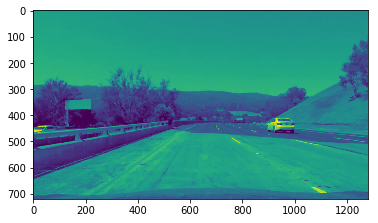

In [269]:
video_printed = subclip.fl_image(printImage)
video_printed.write_videofile("test.mp4", audio=False)